In [59]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import keras
from tensorflow.keras.layers import Dense, Dropout, Input, LeakyReLU
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.datasets import mnist
from tqdm import tqdm
# from tensorflow.keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.optimizers import Adam

In [60]:
def load_data():
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = (x_train.astype(np.float32)/255)
    
    # convert shape of x_train from (60000, 28, 28) to (60000, 784) 
    # 784 columns per row
    x_train = x_train.reshape(60000, 784)
    return (x_train, y_train, x_test, y_test)
(X_train, y_train,X_test, y_test)=load_data()
print(X_train.shape)

(60000, 784)


In [61]:
def adam_optimizer():
    return Adam(learning_rate=0.0002, beta_1=0.5)

In [62]:
def create_generator():
    generator=Sequential()
    generator.add(Dense(units=256,input_dim=100))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=512))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=1024))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Dense(units=784, activation='tanh'))
    
    generator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return generator
g=create_generator()
g.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_120 (Dense)            (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_90 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_121 (Dense)            (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_91 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_122 (Dense)            (None, 1024)              525312    
_________________________________________________________________
leaky_re_lu_92 (LeakyReLU)   (None, 1024)              0         
_________________________________________________________________
dense_123 (Dense)            (None, 784)             

In [63]:
def create_discriminator():
    discriminator=Sequential()
    discriminator.add(Dense(units=1024,input_dim=784))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
    
    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))
       
    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Dense(units=1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=adam_optimizer(), metrics=['accuracy'])
    return discriminator
d =create_discriminator()
d.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_124 (Dense)            (None, 1024)              803840    
_________________________________________________________________
leaky_re_lu_93 (LeakyReLU)   (None, 1024)              0         
_________________________________________________________________
dropout_30 (Dropout)         (None, 1024)              0         
_________________________________________________________________
dense_125 (Dense)            (None, 512)               524800    
_________________________________________________________________
leaky_re_lu_94 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_126 (Dense)            (None, 256)             

In [64]:
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer=adam_optimizer())
    return gan
gan = create_gan(d,g)
gan.summary()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 100)]             0         
_________________________________________________________________
sequential_30 (Sequential)   (None, 784)               1486352   
_________________________________________________________________
sequential_31 (Sequential)   (None, 1)                 1460225   
Total params: 2,946,577
Trainable params: 1,486,352
Non-trainable params: 1,460,225
_________________________________________________________________


In [65]:
def plot_generated_images(epoch, generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(100,28,28)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image %d.png' %epoch)

480
Epoch 1
>2, 1/480, d=0.712, g=0.855
>2, 2/480, d=0.641, g=0.817
>2, 3/480, d=0.594, g=0.808
>2, 4/480, d=0.579, g=0.791
>2, 5/480, d=0.580, g=0.791
>2, 6/480, d=0.583, g=0.785
>2, 7/480, d=0.589, g=0.799
>2, 8/480, d=0.600, g=0.809
>2, 9/480, d=0.612, g=0.822
>2, 10/480, d=0.622, g=0.855
>2, 11/480, d=0.627, g=0.872
>2, 12/480, d=0.630, g=0.893
>2, 13/480, d=0.646, g=0.923
>2, 14/480, d=0.670, g=0.937
>2, 15/480, d=0.705, g=0.942
>2, 16/480, d=0.724, g=0.938
>2, 17/480, d=0.746, g=0.940
>2, 18/480, d=0.758, g=0.994
>2, 19/480, d=0.739, g=1.016
>2, 20/480, d=0.748, g=1.027
>2, 21/480, d=0.751, g=1.054
>2, 22/480, d=0.752, g=1.036
>2, 23/480, d=0.762, g=1.006
>2, 24/480, d=0.771, g=1.020
>2, 25/480, d=0.755, g=1.028
>2, 26/480, d=0.732, g=1.081
>2, 27/480, d=0.712, g=1.130
>2, 28/480, d=0.670, g=1.121
>2, 29/480, d=0.673, g=1.130
>2, 30/480, d=0.684, g=1.061
>2, 31/480, d=0.701, g=1.044
>2, 32/480, d=0.700, g=1.023
>2, 33/480, d=0.695, g=1.051
>2, 34/480, d=0.703, g=1.040
>2, 35/480,

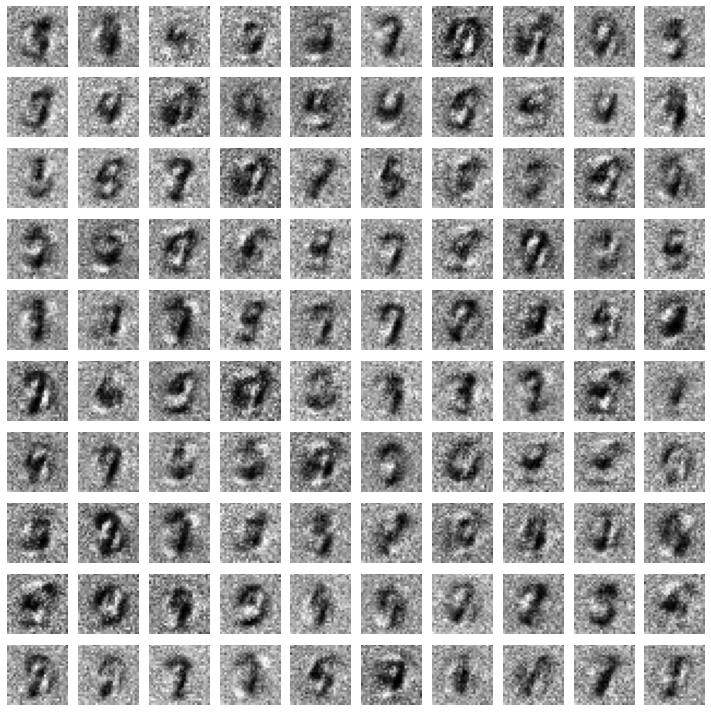

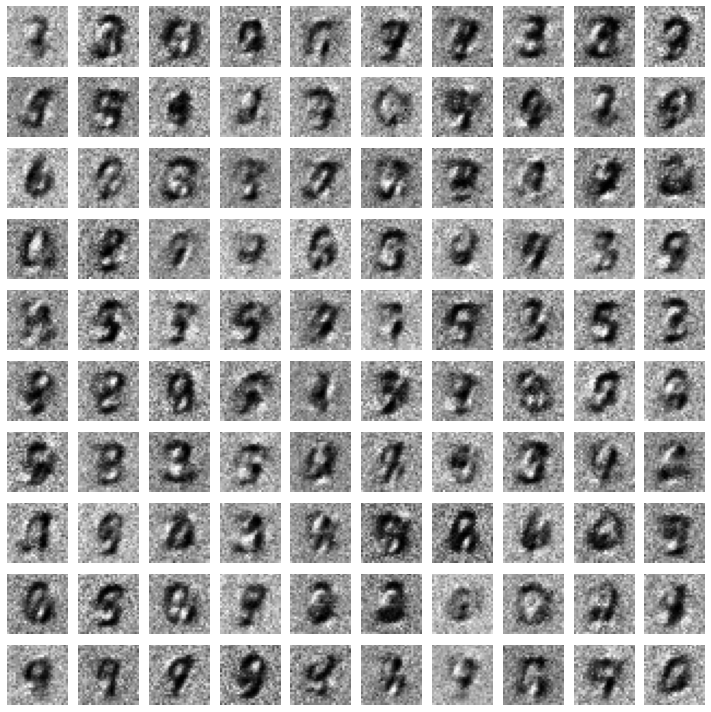

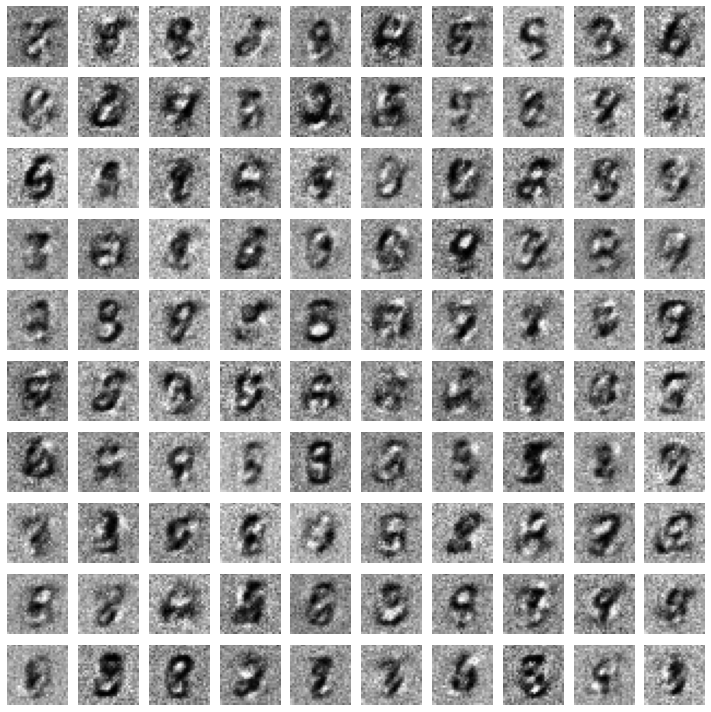

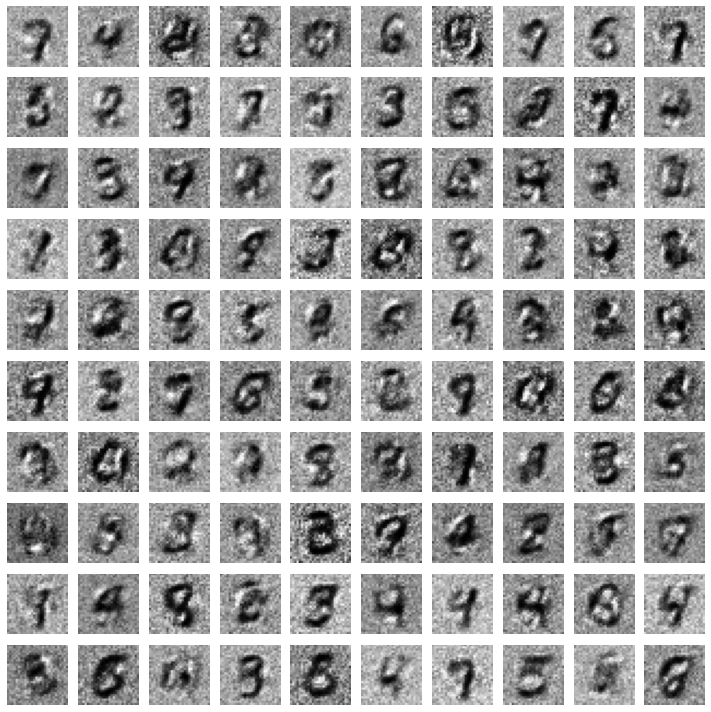

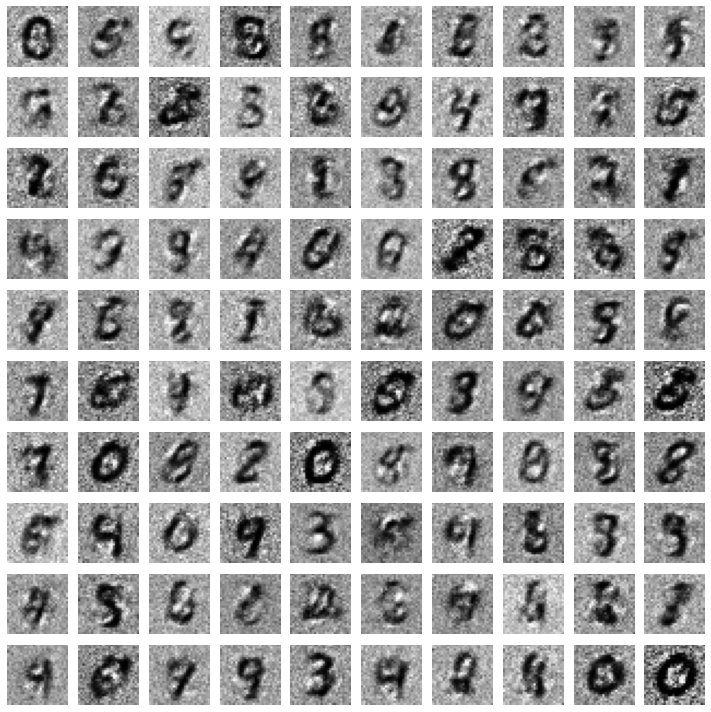

...

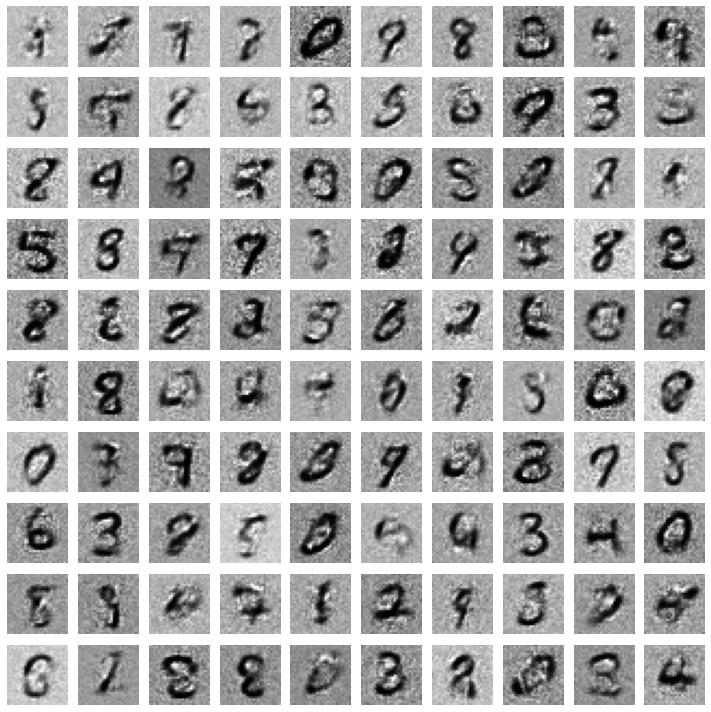

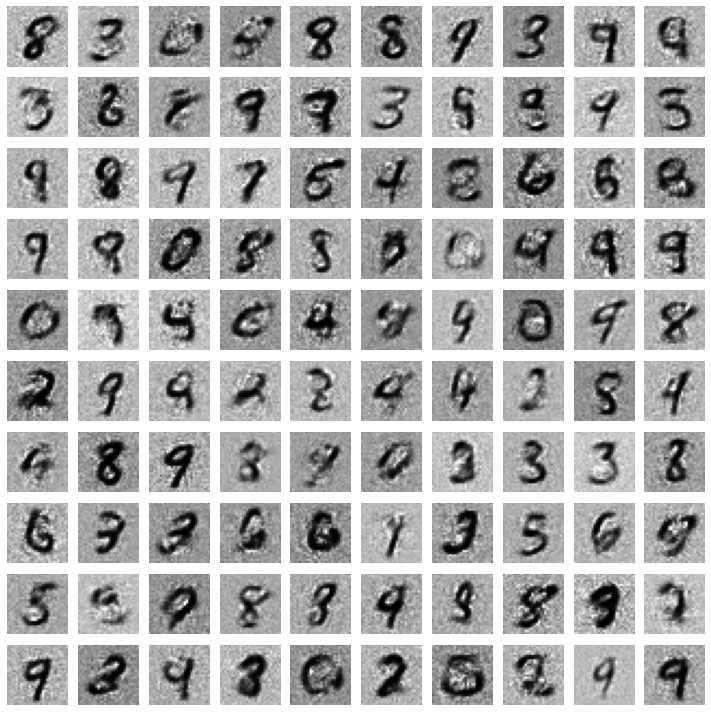

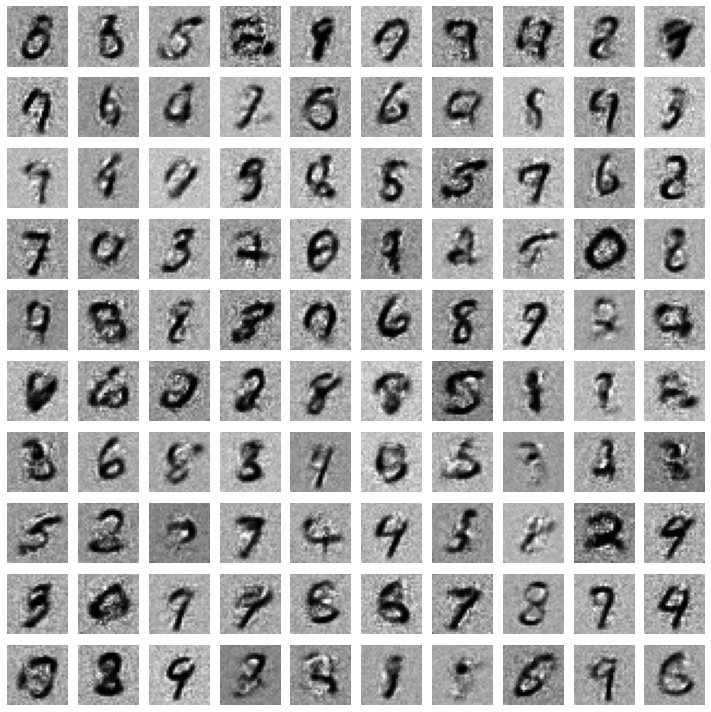

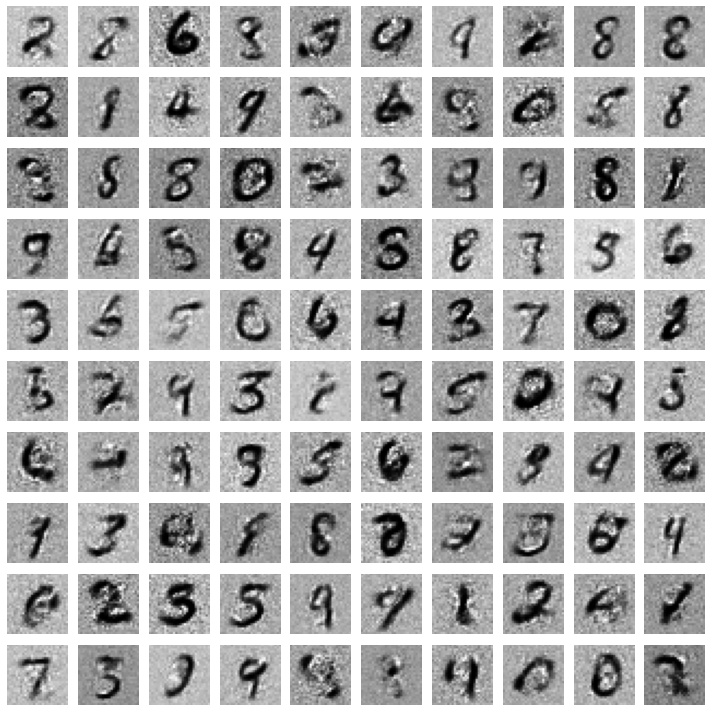

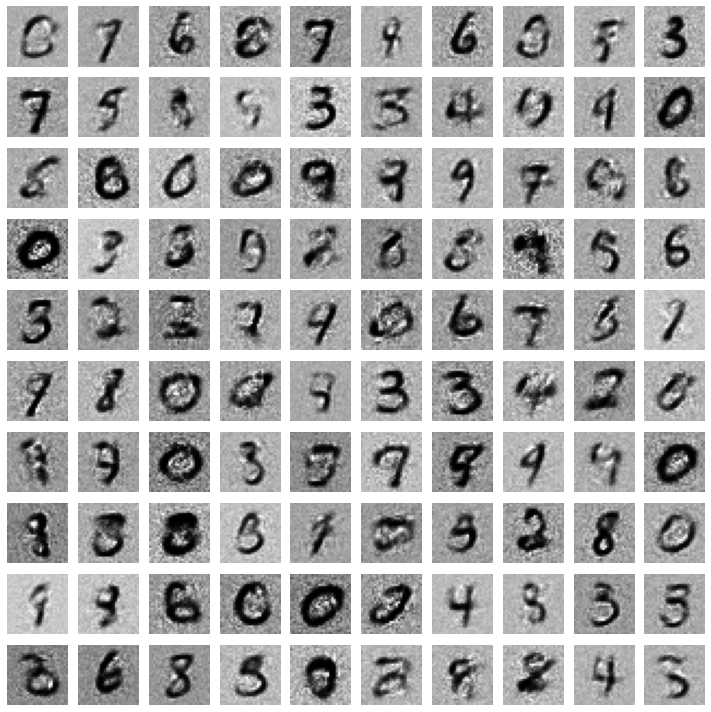

In [67]:
def training(epochs=1, batch_size=125):
    
    #Loading the data
    (X_train, y_train, X_test, y_test) = load_data()
    batch_count = int(X_train.shape[0] / batch_size)
    print(batch_count)
    # Creating GAN
    generator= create_generator()
    discriminator= create_discriminator()
    gan = create_gan(discriminator, generator)
    
    for e in range(1,epochs+1 ):
        print("Epoch %d" %e)
        for batch_idx in range(batch_count):
        #generate  random noise as an input  to  initialize the  generator
            noise= np.random.normal(0,1, [batch_size, 100])
            
            # Generate fake MNIST images from noised input
#             print('noise',noise, noise.shape)
            generated_images = generator.predict(noise)
#             print('generated_images',generated_images, generated_images.shape)
            
#             batch_start = batch_idx * batch_size
            # Get a random set of  real images
#             image_batch = X_train[batch_start:(batch_start + batch_size)]
            image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
#             print('image_batch',image_batch, image_batch.shape)
            #Construct different batches of  real and fake data 
            X= np.concatenate([image_batch, generated_images])
#             print('X',X, X.shape)
            # Labels for generated and real data
            y_dis=np.zeros(2*batch_size)
            y_dis[:batch_size]=0.9
#             print('y_dis',y_dis, y_dis.shape)
            #Pre train discriminator on  fake and real data  before starting the gan. 
#             discriminator.trainable=True
            d_loss,_= discriminator.train_on_batch(X, y_dis)
            #Tricking the noised input of the Generator as real data
            noise= np.random.normal(0,1, [batch_size, 100])
#             print('noise',noise, noise.shape)
            y_gen = np.ones((batch_size,1))
#             print('y_gen',y_gen, y_gen.shape)
            # During the training of gan, 
            # the weights of discriminator should be fixed. 
            #We can enforce that by setting the trainable flag
            
            #training  the GAN by alternating the training of the Discriminator 
            #and training the chained GAN model with Discriminator’s weights freezed.
            g_loss= gan.train_on_batch(noise, y_gen)
            print('>%d, %d/%d, d=%.3f, g=%.3f' % (e+1, batch_idx+1, batch_count, d_loss, g_loss))
        if e == 1 or e % 1 == 0:
           
            plot_generated_images(e, generator)
training(20,125)

In [45]:
# for i in range(100,200):
#     print(i,60000/i)

In [23]:
noise= np.random.normal(0,1, [128, 100])

In [31]:
(X_train, y_train, X_test, y_test) = load_data()
X_train.shape

(60000, 784)

In [27]:
import matplotlib.pyplot as plt

c:\python36\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  """Entry point for launching an IPython kernel.


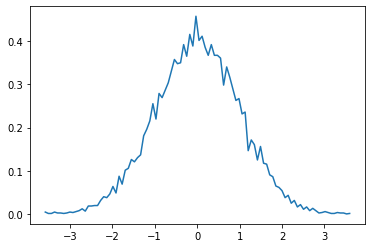

In [33]:
hist, bins = np.histogram(noise.reshape(12800), bins=100, normed=True)
bin_centers = (bins[1:]+bins[:-1])*0.5
plt.plot(bin_centers, hist)

c:\python36\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  """Entry point for launching an IPython kernel.


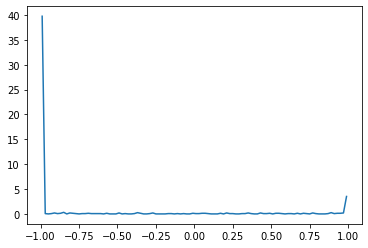

In [34]:
hist, bins = np.histogram(X_train[0], bins=100, normed=True)
bin_centers = (bins[1:]+bins[:-1])*0.5
plt.plot(bin_centers, hist)